In [20]:
%pip install ultralytics

Note: you may need to restart the kernel to use updated packages.


In [21]:
import os
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
import shutil
from shutil import copyfile
import matplotlib.pyplot as plt
from matplotlib import animation, rc
rc('animation', html='jshtml')
from PIL import Image

import ultralytics
from ultralytics import YOLO
ultralytics.checks()

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.49 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 6014.0/8062.4 GB disk)


In [24]:

import kagglehub

# Download latest version
path = kagglehub.dataset_download("vencerlanz09/taco-dataset-yolo-format")
trains = path + '/train'
valids = path + '/valid'
tests = path + '/test'

print("Path to dataset files:", path)

print("Path to dataset files:", train)
     

Path to dataset files: /kaggle/input/taco-dataset-yolo-format
Path to dataset files: /kaggle/input/taco-dataset-yolo-format/train


In [26]:
import yaml

data_yaml = dict(
    train =trains,
    val =valids,
    test =tests,
    nc =18,
    names =['Aluminium foil', 'Bottle cap', 'Bottle', 'Broken glass', 'Can',
            'Carton', 'Cigarette', 'Cup', 'Lid', 'Other litter', 'Other plastic',
            'Paper', 'Plastic bag - wrapper', 'Plastic container', 'Pop tab',
            'Straw', 'Styrofoam piece', 'Unlabeled litter']
)

with open('data.yaml', 'w') as outfile:
    yaml.dump(data_yaml, outfile, default_flow_style=True)

%cat data.yaml


{names: [Aluminium foil, Bottle cap, Bottle, Broken glass, Can, Carton, Cigarette,
    Cup, Lid, Other litter, Other plastic, Paper, Plastic bag - wrapper, Plastic container,
    Pop tab, Straw, Styrofoam piece, Unlabeled litter], nc: 18, test: /kaggle/input/taco-dataset-yolo-format/test,
  train: /kaggle/input/taco-dataset-yolo-format/train, val: /kaggle/input/taco-dataset-yolo-format/valid}


In [27]:
model = YOLO("yolov8x.pt") 

100%|██████████| 131M/131M [00:00<00:00, 159MB/s] 


In [29]:
!yolo task=detect mode=train model=yolov8x.pt data=data.yaml epochs=1 imgsz=416

Ultralytics 8.3.49 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8x.pt, data=data.yaml, epochs=1, time=None, patience=100, batch=16, imgsz=416, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None,

In [31]:
paths2=[]
for dirname, _, filenames in os.walk('/kaggle/working/runs/detect/train2'):
    for filename in filenames:
        if filename[-4:]=='.jpg':
            paths2+=[(os.path.join(dirname, filename))]
paths2=sorted(paths2)

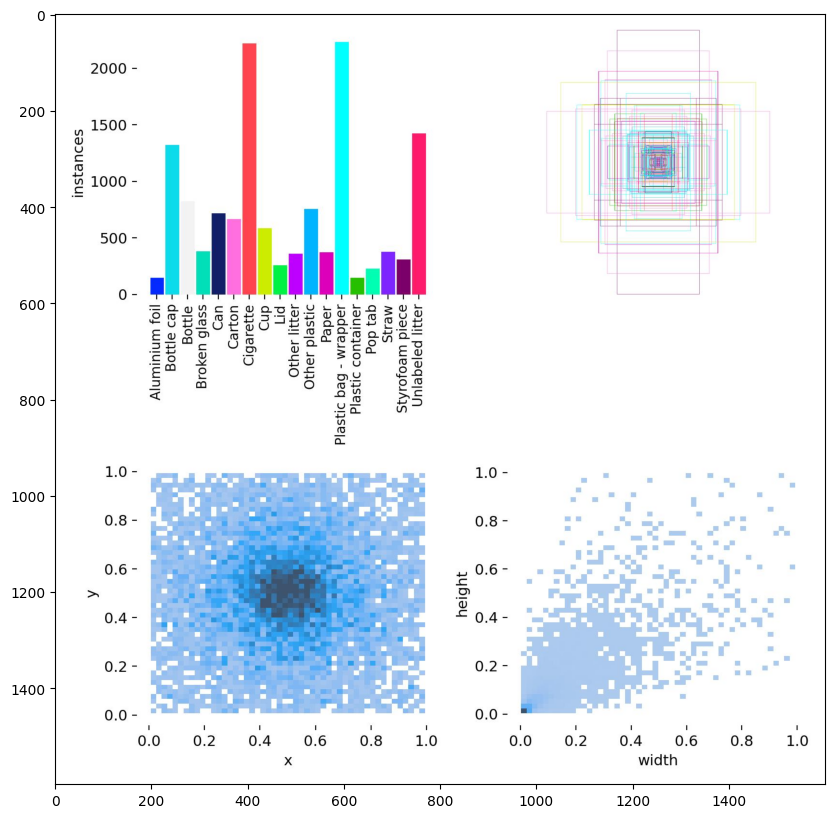

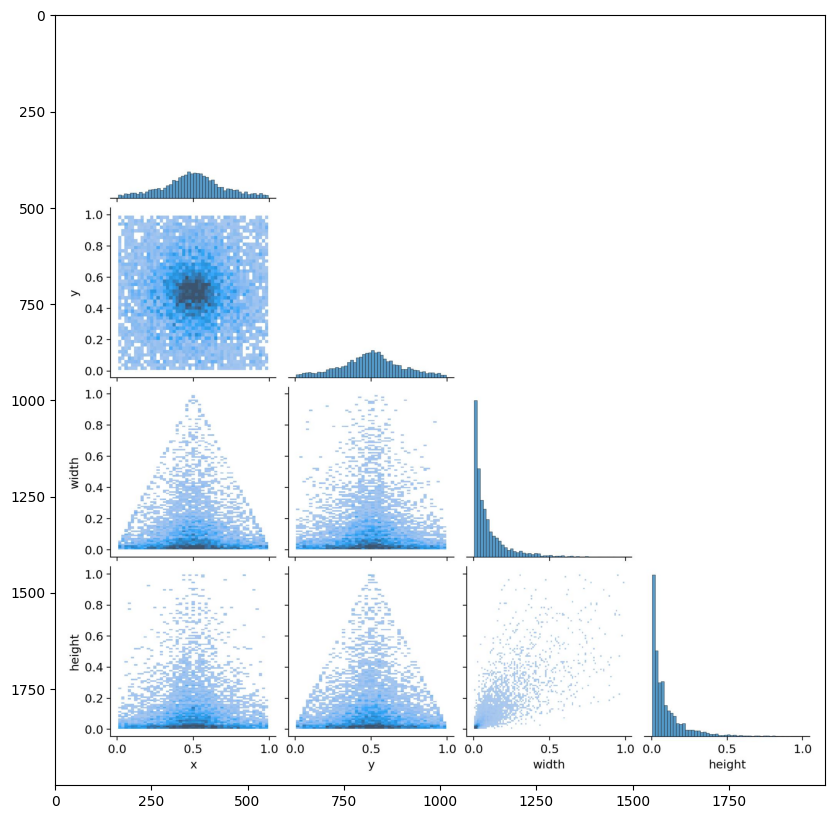

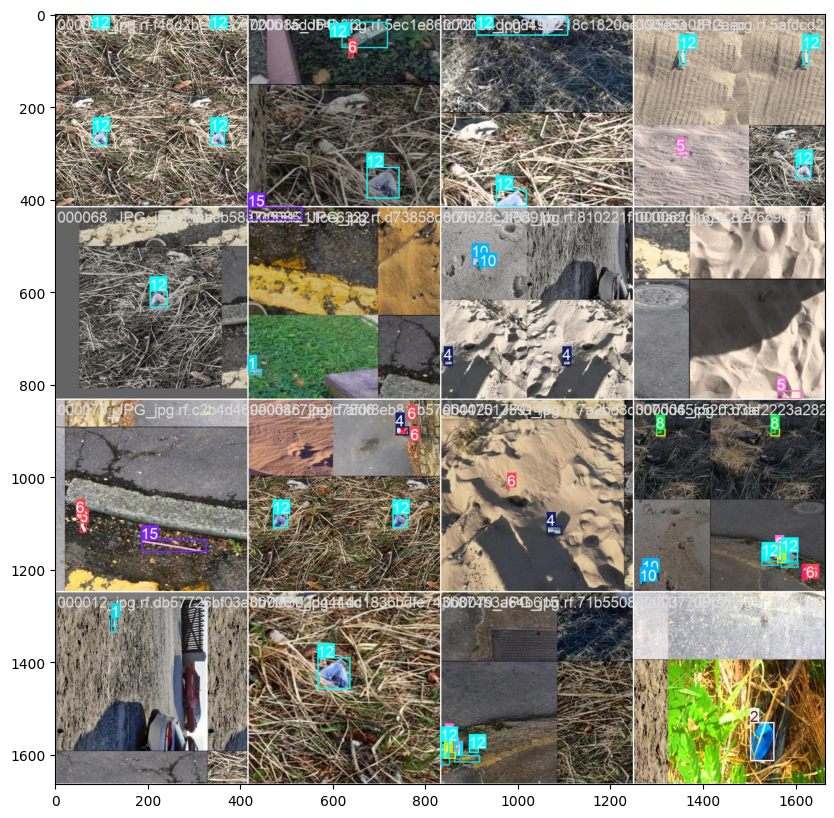

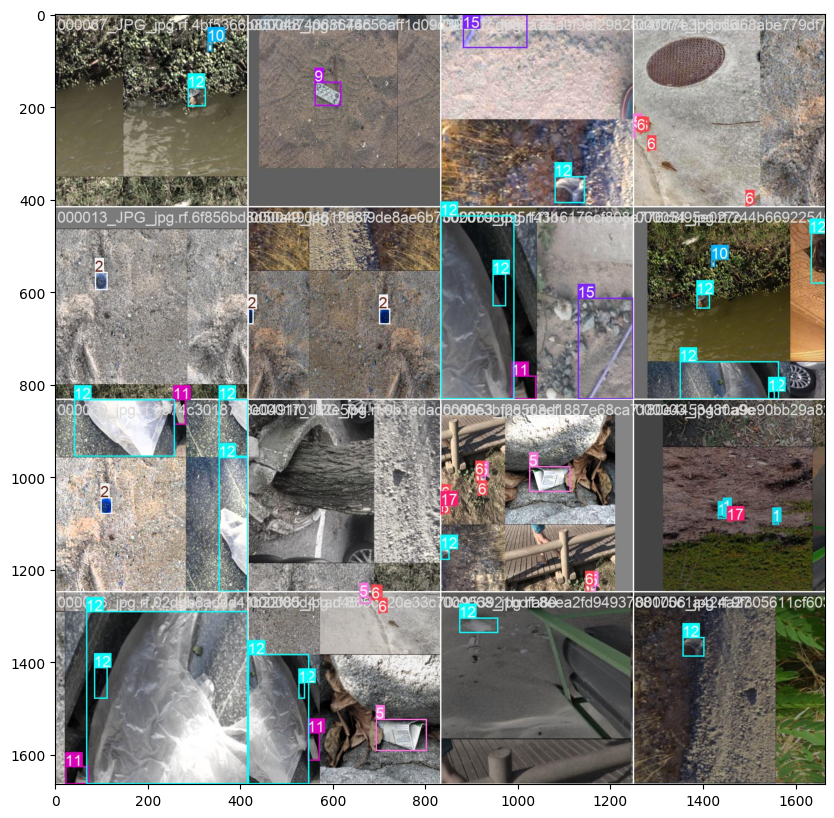

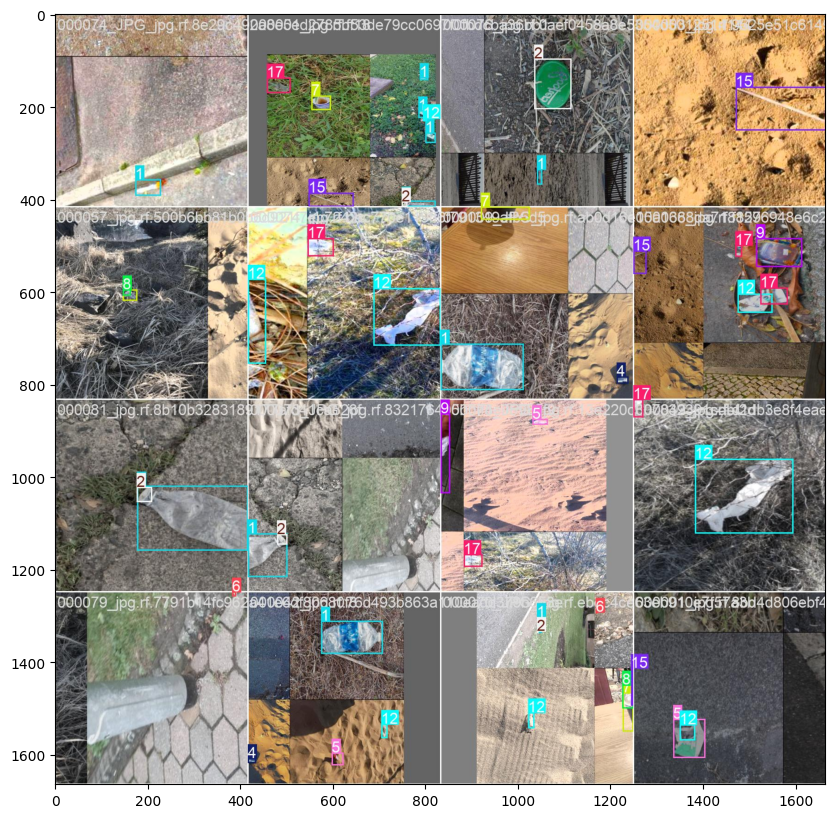

...

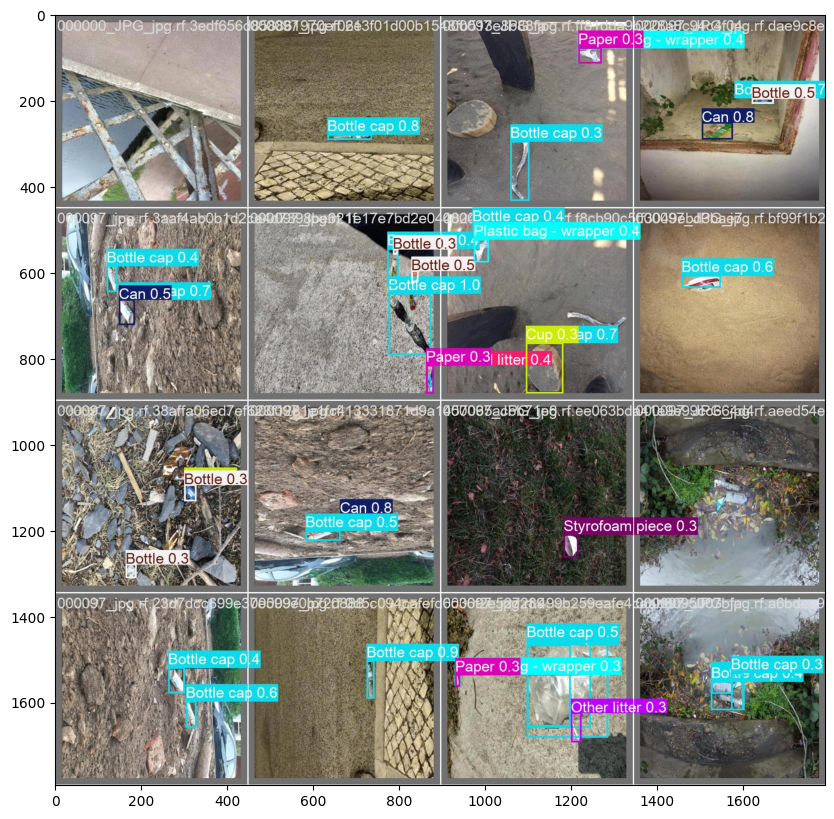

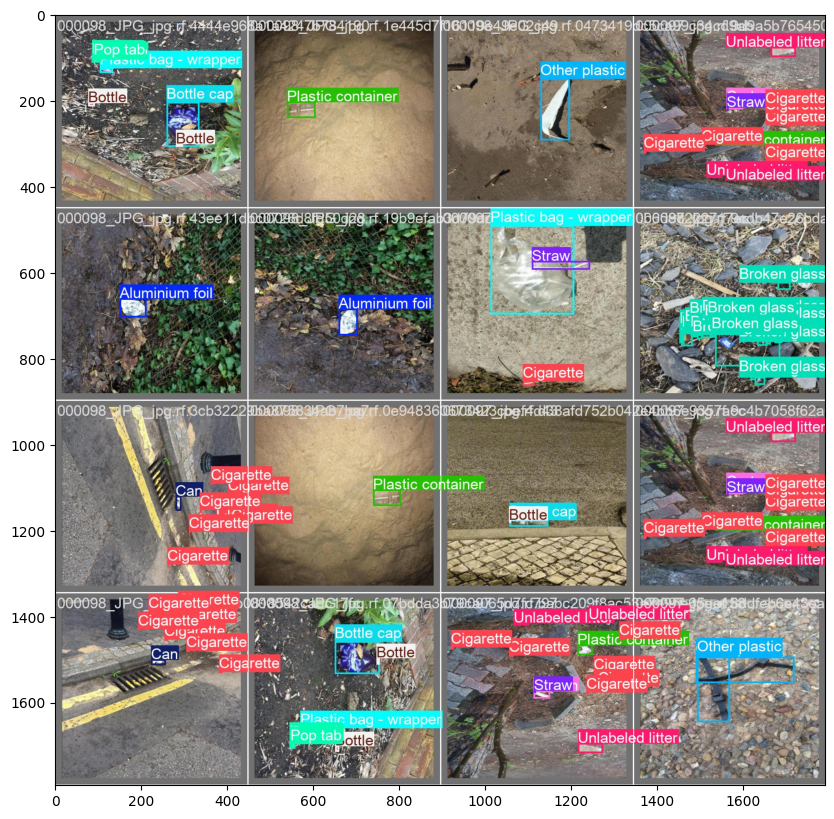

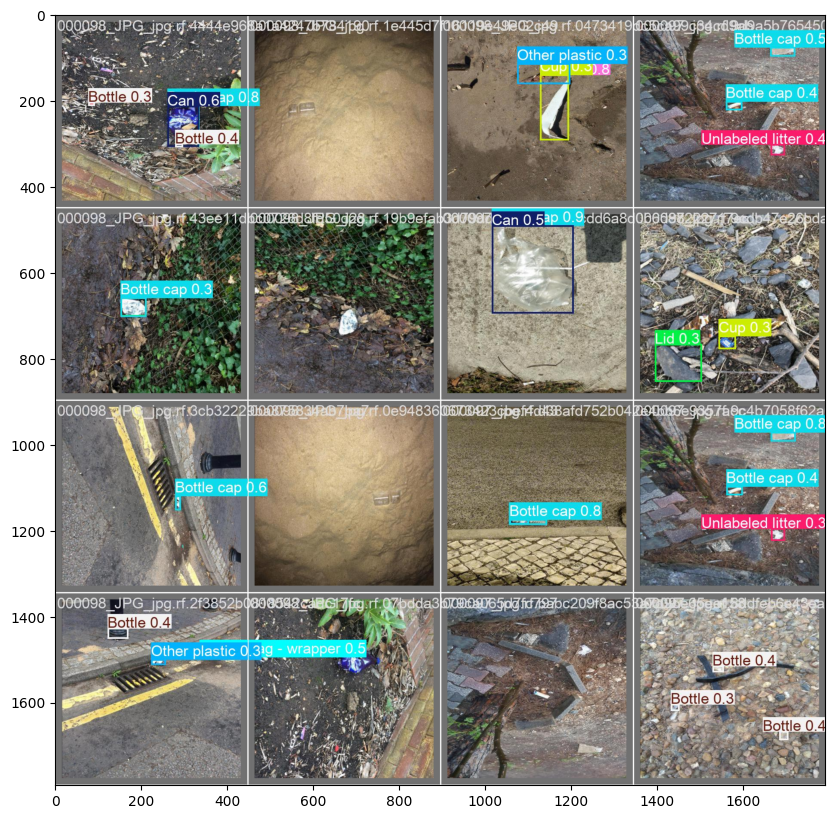

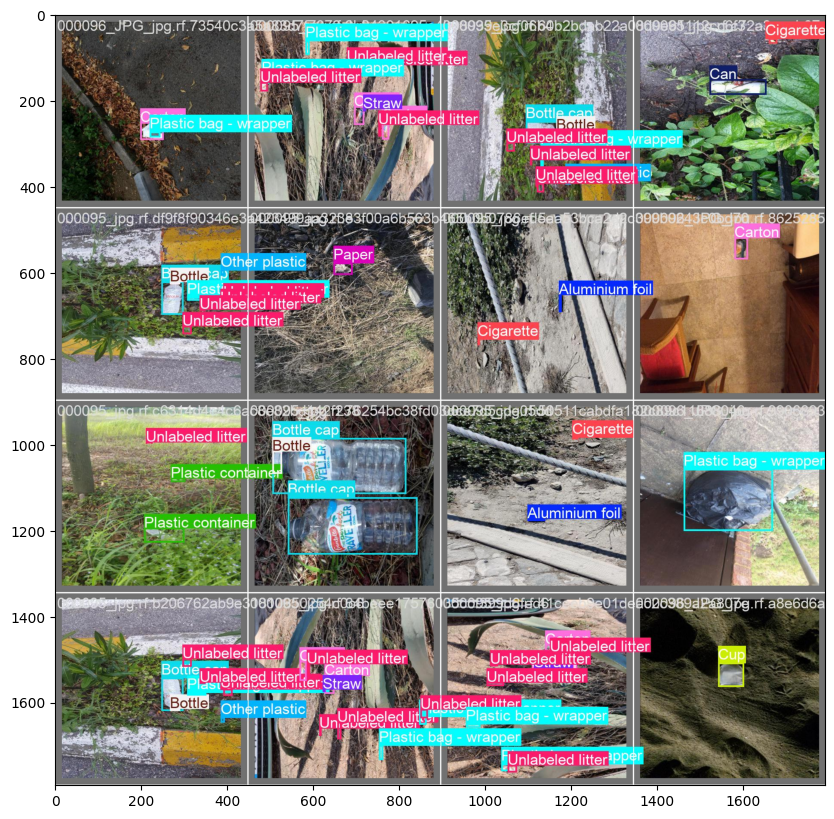

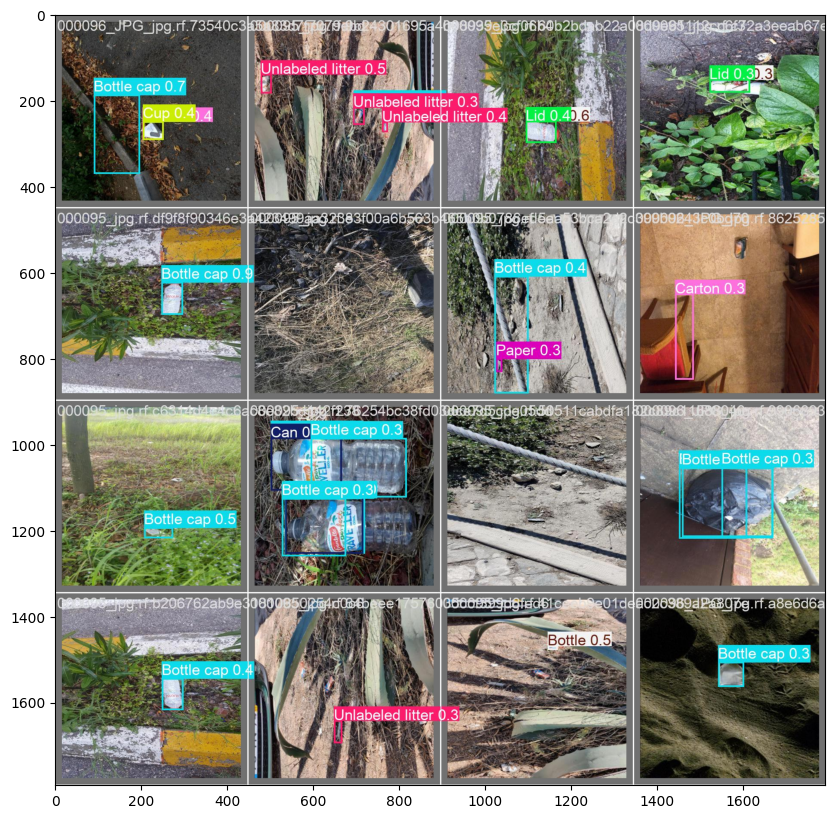

In [32]:
for path in paths2:
    image = Image.open(path)
    image=np.array(image)
    plt.figure(figsize=(20,10))
    plt.imshow(image)
    plt.show()